In [1]:
import os
from pathlib import Path

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

In [2]:
save_path = Path("C:/Users/bruij_kn/OneDrive - Stichting Deltares/Documents/GitHub/msc-thesis/Figures/Python")

Set style

In [3]:
# plt.style.use('ggplot')

In [4]:
SMALL_SIZE = 16
MEDIUM_SIZE = 20
BIGGER_SIZE = 25

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

Load data

In [5]:
fpath = Path('./ts_datasets/storms_engelstad.csv')

df = pd.read_csv(fpath, parse_dates=['time'])

df.head()

,Unnamed: 0,time,Hs(m),Tm(s),Dm(deg),Tp(s),Dp(deg),SS(m),WL(m)
0,0,1979-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,0.721964,-0.383036
1,1,1979-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,0.692138,-0.412862
2,2,1979-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,0.666204,-0.438796
3,3,1979-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,0.637133,-0.467867
4,4,1979-01-01 04:00:00,NaN,NaN,NaN,NaN,NaN,0.614202,-0.490798


Now compute runup.

In [13]:
# compute Beta (average slope in envelope of WL +- 2*sigma, with sigma ~= H0 / 4)
beta_f = 1/10

# compute L0
L0 = 9.81 * df['Tm(s)']**2 / (2 * np.pi)

# read in H0
H0 = df['Hs(m)']

# compute R2
df['R2(m)'] = 1.1 * (0.35 * beta_f * (H0 * L0)**0.5 + (H0 * L0 * (0.563 * beta_f**2 + 0.004))**0.5 / 2)
df['TWL(m)'] = df['R2(m)'] + df['WL(m)']

Plot

In [14]:
import hvplot
import hvplot.pandas
import holoviews as hv
# hv.help(hv.Curve)

In [15]:
t_start = pd.to_datetime("2000-01-01")
t_end = pd.to_datetime("2020-01-01")

df_masked = df[(df.time > t_start) & (df.time < t_end)]

threshold = 3.5

curves = df_masked.hvplot(x='time', y=['R2(m)', 'WL(m)','TWL(m)']) * hv.HLine(threshold).opts(color='black')

curves.opts(width=1500)

# fig, ax = plt.subplots(figsize=(10, 5))

# ax.plot(df.time, df['R2(m)'], label='R2', alpha=0.3)
# ax.plot(df.time, df['WL(m)'], label='WL', alpha=0.3)
# ax.plot(df.time, df['R2(m)'] + df['WL(m)'], label='R2 + WL')

# ax.axhline(2, c='r', ls='--', label='threshold')

# ax.set_xlim((t_start, t_end))
# ax.legend()

:Overlay
   .NdOverlay.I :NdOverlay   [Variable]
      :Curve   [time]   (value)
   .HLine.I     :HLine   [x,y]

In [16]:
# plt.plot(df.time, df['Hs(m)'])

# plt.xlim((t_start, t_end))

Let's try a threshold of 2m.

In [17]:
thresholds = np.arange(2, 3.5, 0.05)  # [m]

In [18]:
df['TWL(m)'] = df['R2(m)'].values + df['WL(m)'].values

for th in thresholds:
    df[f'# exceeded ({th:.2f})'] = df['TWL(m)'] > th

df['year'] = df['time'].dt.year
df_sums = df.groupby('year').sum('exceeded?').drop(['Unnamed: 0', 'Hs(m)', 'Tm(s)', 'Dm(deg)', 'Tp(s)', 'Dp(deg)', 'SS(m)', 'WL(m)', 'R2(m)', 'TWL(m)'], axis=1)
display(df_sums)

,# exceeded (2.00),# exceeded (2.05),# exceeded (2.10),# exceeded (2.15),# exceeded (2.20),# exceeded (2.25),# exceeded (2.30),# exceeded (2.35),# exceeded (2.40),# exceeded (2.45),...,# exceeded (3.00),# exceeded (3.05),# exceeded (3.10),# exceeded (3.15),# exceeded (3.20),# exceeded (3.25),# exceeded (3.30),# exceeded (3.35),# exceeded (3.40),# exceeded (3.45)
year,,,,,,,,,,,,,,,,,,,,,
1979,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1980,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1981,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1982,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1983,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1984,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1985,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1986,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1987,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


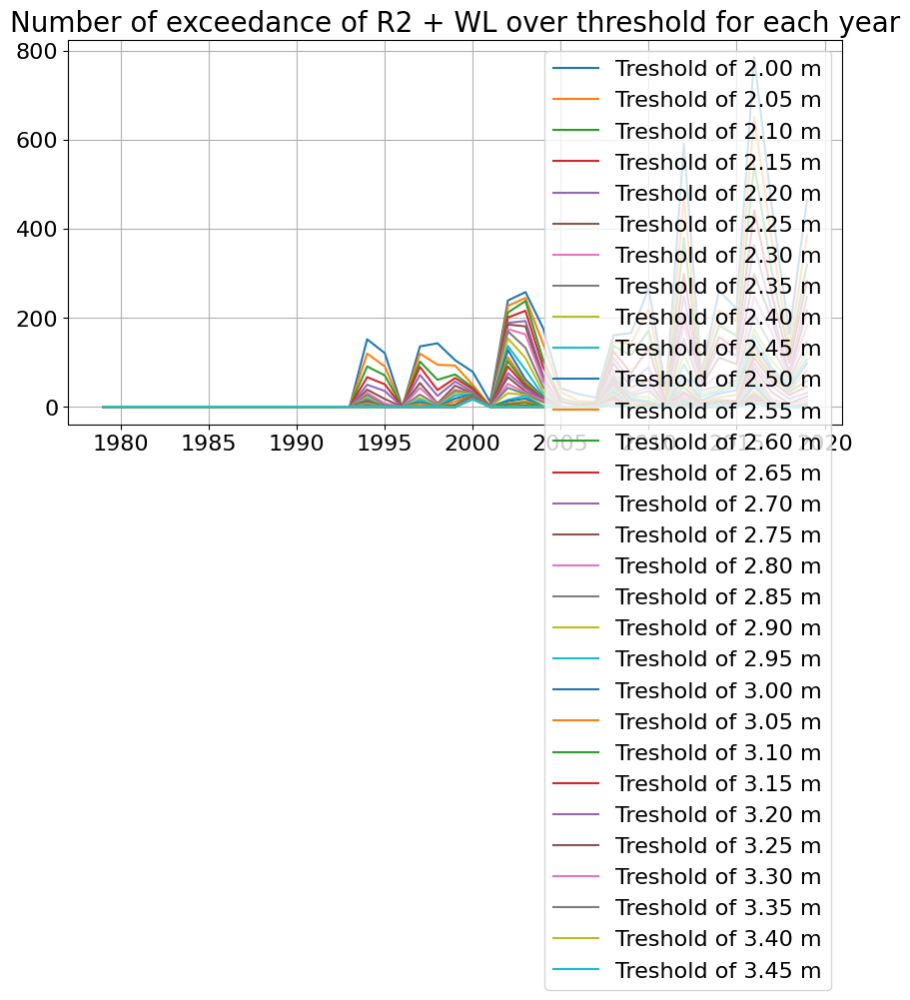

In [19]:
fig, ax = plt.subplots(figsize=(10,5))

for th in thresholds:
    ax.plot(df_sums.index, df_sums[f'# exceeded ({th:.2f})'], label=f'Treshold of {th:.2f} m')

ax.grid()
ax.set_title('Number of exceedance of R2 + WL over threshold for each year')
ax.legend()

It seems that 2m is fine.